In [1]:
from uuid import uuid4
from neo4j import GraphDatabase

driver = GraphDatabase.driver(
    "bolt://localhost:7687", auth=("neo4j", "neo4j1234")
)

def run_query(tx, cypher, params=None):
    return list(tx.run(cypher, params or {}))

with driver.session(database="orders") as session:
    # 1) storeId 목록
    store_ids = session.execute_read(
        run_query,
        "MATCH ()-[r:DINED_WITH]-() RETURN DISTINCT r.storeId AS storeId"
    )
    store_ids = [row["storeId"] for row in store_ids]

    for store_id in store_ids:
        graph_name = f"customerGraph_{store_id}_{uuid4().hex[:6]}"
        print(f"▶ Processing storeId: {store_id}", type(store_id))
        
        # 2) Graph projection (nodeQuery + relationshipQuery)
        
        query = f"""
        CALL gds.graph.project.cypher(
          '{graph_name}',
          'MATCH (c:Customers)-[r:DINED_WITH]-() WHERE r.storeId = {store_id} RETURN DISTINCT id(c) AS id',
          'MATCH (c1:Customers)-[r:DINED_WITH]-(c2:Customers) WHERE r.storeId = {store_id} RETURN id(c1) AS source, id(c2) AS target, coalesce(r.times, 1.0) AS weight'
        )
        """
        session.execute_write(run_query, query)

        # 3) 중심성 지표 계산 -------------------------------------------------
        algo_queries = [
            # PageRank (weighted)
            f"""
            CALL gds.pageRank.write('{graph_name}', {{
              relationshipWeightProperty:'weight',
              writeProperty:'pagerank_{store_id}'
            }})
            """,
            # Degree (weighted)
            f"""
            CALL gds.degree.write('{graph_name}', {{
              relationshipWeightProperty:'weight',
              writeProperty:'degree_{store_id}'
            }})
            """,
            # Betweenness (unweighted)
            f"""
            CALL gds.betweenness.write('{graph_name}', {{
              writeProperty:'betweenness_{store_id}'
            }})
            """,
            # Closeness (unweighted)
            f"""
            CALL gds.closeness.write('{graph_name}', {{
              writeProperty:'closeness_{store_id}'
            }})
            """,
            # Eigenvector (weighted)
            f"""
            CALL gds.eigenvector.write('{graph_name}', {{
              relationshipWeightProperty:'weight',
              writeProperty:'eigen_{store_id}'
            }})
            """,
            # Louvain (weighted)
            f"""
            CALL gds.louvain.write('{graph_name}', {{
              relationshipWeightProperty:'weight',
              writeProperty:'community_{store_id}'
            }})
            """
        ]
        for q in algo_queries:
            session.execute_write(run_query, q)

        # 4) 메모리 그래프 삭제
        session.execute_write(
            run_query, f"CALL gds.graph.drop('{graph_name}')"
        )
        print(f"✅ Finished storeId: {store_id}\n")

driver.close()

▶ Processing storeId: 3 <class 'int'>


Received notification from DBMS server: {severity: WARNING} {code: Neo.ClientNotification.Statement.FeatureDeprecationWarning} {category: DEPRECATION} {title: This feature is deprecated and will be removed in future versions.} {description: The query used a deprecated procedure. ('gds.graph.project.cypher' has been replaced by 'gds.graph.project Cypher projection as an aggregation function')} {position: line: 2, column: 9, offset: 9} for query: "\n        CALL gds.graph.project.cypher(\n          'customerGraph_3_bf5abf',\n          'MATCH (c:Customers)-[r:DINED_WITH]-() WHERE r.storeId = 3 RETURN DISTINCT id(c) AS id',\n          'MATCH (c1:Customers)-[r:DINED_WITH]-(c2:Customers) WHERE r.storeId = 3 RETURN id(c1) AS source, id(c2) AS target, coalesce(r.times, 1.0) AS weight'\n        )\n        "
Received notification from DBMS server: {severity: WARNING} {code: Neo.ClientNotification.Statement.FeatureDeprecationWarning} {category: DEPRECATION} {title: This feature is deprecated and 

✅ Finished storeId: 3

▶ Processing storeId: 10028 <class 'int'>


Received notification from DBMS server: {severity: WARNING} {code: Neo.ClientNotification.Statement.FeatureDeprecationWarning} {category: DEPRECATION} {title: This feature is deprecated and will be removed in future versions.} {description: The query used a deprecated procedure. ('gds.graph.project.cypher' has been replaced by 'gds.graph.project Cypher projection as an aggregation function')} {position: line: 2, column: 9, offset: 9} for query: "\n        CALL gds.graph.project.cypher(\n          'customerGraph_10028_a19c89',\n          'MATCH (c:Customers)-[r:DINED_WITH]-() WHERE r.storeId = 10028 RETURN DISTINCT id(c) AS id',\n          'MATCH (c1:Customers)-[r:DINED_WITH]-(c2:Customers) WHERE r.storeId = 10028 RETURN id(c1) AS source, id(c2) AS target, coalesce(r.times, 1.0) AS weight'\n        )\n        "
Received notification from DBMS server: {severity: WARNING} {code: Neo.ClientNotification.Statement.FeatureDeprecationWarning} {category: DEPRECATION} {title: This feature is dep

✅ Finished storeId: 10028

▶ Processing storeId: 5 <class 'int'>


Received notification from DBMS server: {severity: WARNING} {code: Neo.ClientNotification.Statement.FeatureDeprecationWarning} {category: DEPRECATION} {title: This feature is deprecated and will be removed in future versions.} {description: The procedure has a deprecated field. ('schema' returned by 'gds.graph.drop' is deprecated.)} {position: line: 1, column: 1, offset: 0} for query: "CALL gds.graph.drop('customerGraph_5_86e7d8')"


✅ Finished storeId: 5



In [99]:
import pandas as pd
from neo4j import GraphDatabase

# Neo4j connection parameters
uri = "bolt://localhost:7687"
auth = ("neo4j", "neo4j1234")
database = "orders"

# Initialize driver
driver = GraphDatabase.driver(uri, auth=auth)

# List of store IDs for which metrics were computed
store_ids = [3, 5, 10028]

# Collect rows
rows = []

with driver.session(database=database) as session:
    for store_id in store_ids:
        # Cypher to fetch metrics for this store_id
        query = f"""
        MATCH (c:Customers)
        WHERE c.pagerank_{store_id} IS NOT NULL
        RETURN
          c.id AS customerId,
          {store_id} AS storeId,
          c.pagerank_{store_id} AS pagerank,
          c.degree_{store_id} AS degree,
          c.betweenness_{store_id} AS betweenness,
          c.closeness_{store_id} AS closeness,
          c.eigen_{store_id} AS eigen,
          c.community_{store_id} AS community
        """
        result = session.run(query)
        for record in result:
            rows.append(dict(record))

driver.close()

# Create DataFrame
df = pd.DataFrame(rows)

# Display to user
display(df)

,customerId,storeId,pagerank,degree,betweenness,closeness,eigen,community
0,01H7MCFH99MSQ0RXEREYY77XPT,3,0.961240,1.00,0.000000e+00,1.000000,0.008778,1
1,01H7MDNCH41780VJNTHZHWYQT0,3,0.961240,1.00,0.000000e+00,1.000000,0.008778,1
2,01H7MF38PVYVJ8NV47H9W0PT60,3,0.961240,1.00,0.000000e+00,1.000000,0.008778,3
3,01H7MGF57GXKKXAFM224MVFMM5,3,0.961240,1.00,0.000000e+00,1.000000,0.008778,3
4,01H7MQP5TK1XRZ258WYVS1ZG57,3,0.961240,1.00,0.000000e+00,1.000000,0.008778,5
5,01H7MR222VNA5TVW46QW3D599C,3,0.961240,1.00,0.000000e+00,1.000000,0.008778,5
6,01H7MRMK6QQJF9DGHPMFSG2TS2,3,0.750151,3.00,0.000000e+00,0.714286,0.006584,8
7,01H7MS27YF3PVH9EVQ28DVKY6G,3,1.383419,6.00,4.000000e+00,1.000000,0.013167,8
8,01H7MS3VJPR3SFTCCPDJ4QTHM5,3,1.383419,6.00,4.000000e+00,1.000000,0.013167,8
9,01H7MTASY0N4AP0ZQCJSV4Q254,3,0.750151,3.00,0.000000e+00,0.714286,0.006584,8


In [100]:
import pandas as pd
from sqlalchemy import create_engine

# ── 0. MySQL 접속 ────────────────────
# 실제 접속 정보로 아래 값을 수정하세요.
DB_USER = "dev"
DB_PASS = "pwd"
DB_HOST = "localhost"
DB_PORT = "3307"
DB_NAME = "orders"

engine = create_engine(f"mysql+pymysql://{DB_USER}:{DB_PASS}@{DB_HOST}:{DB_PORT}/{DB_NAME}")

# ── 제외할 customerId 목록 ──────────────────────────────
excluded_ids = [
    '01H8K9XWK972V31SN3HDRGY022','01H7S6309C3ZWPVVMAWDYQDQE9',
    '01H7JEGZX7C0NCPN8ZZ3AJXASE','01H7YB33EPCWHTX1WWA9ANJCPG',
    '01H7VSQW5TB8Q4HR1Z4S5CTJKQ','01H4001EP0F1859987V7D4YJFG',
    '01H8DZZ71SYRKB4868B0WHV68E','01H98VZ8Y98MJ489TEJW7QCDS4',
    '01H7S0P3HK62VATNYDHADQPHKJ','01H9A1GTJVCTA13SA9YPEB9ETA',
    '01H7QY348FZQRVP21JAN8X4Z7R','01H7S9MDFE2FW13DPP93DV0WWP',
    '01H7SVW6ECGZ5JXPSV0YS6P7KG','01H7J0A52BKC867SHMNBZ85XTC',
    '01H847J2DGX5KEKMX386TKYGY1','01H7HNC3GKV65TAG2H3SGW7A0H',
    '01H98W8WA1X2E09TZ50DHHRJSA','01H59HRM9W7WZC0Y0Y5YK4ZJS8',
    '01H7HTY1JNFB3H0MP72X5R4QJW','01H7QXJZ7MQ63FTGJTJ5WB5TFR',
    '01H98VE7QSYH0W7AFH9Z9RY6KZ','01H3ZY9J55GM6S18YQGR3DCGQT',
    '01H8Y02HDQZTAH5AVKP51RN05G','01H847HNN73J8V4DN1V1Z7QJTT',
    '01GZZ0C5HVG9049C8AT5Y96HFS','01H9MSJKX4CCDBG2JK327BSP84',
    '01H9MAY8ZDX7KMFBS7EJYJR5AF','01HFDTAW1QRVR8P1HDKH4CNM47',
    '01HF8FYGWYH8Y27TMDPDAK2MH1','01HDJHZ6WM6QQAG627YQ549S8Z',
    '01HF3DR2VBV3D2M0SB6M32WXHQ'
]
excluded_ids_str = ', '.join(f"'{cid}'" for cid in excluded_ids)

# customers 테이블에서 필요한 컬럼만 불러오기
query_customers = f"""
    SELECT id AS customerId, fullName, phoneNumber, dateOfBirth, isMarketingAgreed
    FROM customers
    WHERE id NOT IN ({excluded_ids_str})
"""
customers = pd.read_sql(query_customers, engine)

# summary와 customerId 기준으로 join
customers = customers.merge(df, on="customerId", how="right")

In [101]:
def calculate_g_ratio(df, score_column, top_pct=0.1):
    """
    상위 N% 고객 중 fullName이 'G***t'이고 phoneNumber가 없는 경우의 비율을 계산합니다.

    Parameters:
        df (pd.DataFrame): 고객 데이터프레임
        score_column (str): 상위 N% 기준이 될 점수 컬럼명 (예: 'eigen')
        top_pct (float): 상위 몇 %를 볼 것인지 (기본값 0.1 = 상위 10%)

    Returns:
        dict: {'G***t': 비율, 'Others': 비율}
    """
    if score_column not in df.columns:
        raise ValueError(f"'{score_column}' 컬럼이 DataFrame에 존재하지 않습니다.")

    cutoff = df[score_column].quantile(1 - top_pct)
    top_df = df[df[score_column] >= cutoff]

    total = len(top_df)
    if total == 0:
        return {'G***t': 0, 'Others': 0}

    # 조건: fullName == 'G***t' AND phoneNumber is None
    g_mask = top_df[
        (top_df['fullName'] == 'G***t') &
        ((top_df['phoneNumber'].isna()) | (top_df['phoneNumber'] == ''))
    ]
    g_count = len(g_mask)
    others_count = total - g_count

    return {
        'G***t': g_count / total,
        'Others': others_count / total
    }

In [102]:
centrality = ['pagerank', 'degree', 'betweenness', 'closeness', 'eigen']

for metrics in centrality:
    result = calculate_g_ratio(customers, score_column=metrics, top_pct=0.1)
    
    print(f"✅ {metrics}의 비율")

    print(f"G***t 비율: {result['G***t']:.2%}")
    print(f"기타 비율: {result['Others']:.2%}\n")

✅ pagerank의 비율
G***t 비율: 21.41%
기타 비율: 78.59%

✅ degree의 비율
G***t 비율: 18.48%
기타 비율: 81.52%

✅ betweenness의 비율
G***t 비율: 66.47%
기타 비율: 33.53%

✅ closeness의 비율
G***t 비율: 64.93%
기타 비율: 35.07%

✅ eigen의 비율
G***t 비율: 23.64%
기타 비율: 76.36%



In [67]:
def show_g_rows(df, score_column, top_pct=0.1):
    """
    상위 N% 중 fullName이 'G***t'이고 phoneNumber가 없는 row들과 아닌 row들을 나눠서 출력합니다.
    """
    if score_column not in df.columns:
        raise ValueError(f"'{score_column}' 컬럼이 DataFrame에 존재하지 않습니다.")

    cutoff = df[score_column].quantile(1 - top_pct)
    top_df = df[df[score_column] >= cutoff]

    # 조건: fullName == 'G***t' and phoneNumber is None
    g_rows = top_df[
        (top_df['fullName'] == 'G***t') &
        ((top_df['phoneNumber'].isna()) | (top_df['phoneNumber'] == ''))
    ]
    other_rows = top_df.drop(g_rows.index)  # 나머지

    return g_rows, other_rows

In [71]:
g_rows, other_rows = show_g_rows(customers, 'degree')

print("✅ G***t & phoneNumber 없음:")
display(g_rows.sort_values('degree',ascending=False))

print("✅ 기타:")
display(other_rows.sort_values('degree',ascending=False))

✅ G***t & phoneNumber 없음:


,customerId,fullName,phoneNumber,dateOfBirth,isMarketingAgreed,storeId,pagerank,degree,betweenness,closeness,eigen,community
19901,01JR4YRCW1XC0QE1FFDPAQ2PS3,G***t,None,None,NaT,10028,11.068083,28.50,7.326945e+05,0.161765,0.118088,7898
16745,01JKSDCD52SAQ2BFTRDXFPX24F,G***t,None,None,NaT,10028,7.859605,16.50,1.386508e+06,0.178295,0.078004,6241
8359,01JK2W53J9VVKHNGZ7EQ8KY7K9,G***t,,None,NaT,3,2.208490,12.00,3.200000e+02,0.583333,0.022406,8364
3957,01HQQX6PKWDVFM4Z7TMCQQ9G6E,G***t,None,None,NaT,3,1.399367,10.25,5.773333e+02,0.531250,0.013785,8039
19479,01JQNDCYB5X551F42KVTKZ5JDX,G***t,None,None,NaT,10028,2.404349,9.50,2.122830e+05,0.140022,0.028867,6772
19436,01JQN2Y6FK8SZ7Y9YDKV4MFPJ9,G***t,None,None,NaT,10028,2.342014,8.75,3.984700e+04,0.139471,0.026552,6772
9636,01JP9CWWX14YCKD7NPD7EZVV59,G***t,,None,NaT,3,2.418050,8.50,3.802000e+03,0.397059,0.022546,8019
17116,01JMNNE6KSFFEJEJ20S5Z4G4KG,G***t,None,None,NaT,10028,3.930103,8.50,1.774888e+05,0.154470,0.040795,5518
18264,01JP7MQDB6D1QF5YP5VD5T4HZK,G***t,None,None,NaT,10028,2.916919,8.25,6.441463e+05,0.145725,0.032464,5683
7220,01JE5CKGEQNSHFZBNV4E2H765C,G***t,None,None,NaT,3,1.101366,7.50,4.480000e+02,0.731707,0.010423,7230


✅ 기타:


,customerId,fullName,phoneNumber,dateOfBirth,isMarketingAgreed,storeId,pagerank,degree,betweenness,closeness,eigen,community
172,01H9CY93FVA1J4SA755K6JNAQ8,박*미,************2165,1957-10-15,2025-01-13 06:22:07,3,4.573358,39.5,1375.666667,0.718310,0.051057,8039
196,01H9W8SZ19CAVG54Z4XGR2DWTR,서*곤,************2945,1956-12-16,2024-10-11 02:55:14,3,3.052367,22.0,597.666667,0.614458,0.030001,8039
4573,01HVDPY8W9V96ZDWSHPG4H8NSV,박*준,************5391,1992-11-30,NaT,3,1.947421,19.5,100.000000,0.476636,0.024808,8039
4568,01HVDPN7RBYN5MA5EG6N90S02Z,류*승,************5453,2005-09-09,NaT,3,1.801758,19.0,0.000000,0.472222,0.024180,8039
5080,01J0AFMRWRF5DJSB27JCZV7HTT,박*영,**********1505,2005-06-05,NaT,3,3.037962,18.0,123.666667,0.842105,0.031393,5868
11150,01JTD5YSKZCBVBMX6TX48VYK7N,G***t,**********9828,None,NaT,3,3.540077,17.5,572.666667,0.780488,0.037444,11151
6367,01J9WVS7AAEH2GQT3ATS5BB6ZB,G***t,**********4655,None,NaT,3,1.573626,17.5,4.666667,1.000000,0.015337,6365
6366,01J9WVNK4HQX8DRZ5GZ1HH9MTR,G***t,**********1723,None,NaT,3,1.573626,17.5,4.666667,1.000000,0.015337,6365
6365,01J9WVNBC6K9WYJMSQF89E26G1,송*원,************2934,2000-04-18,2024-10-11 04:02:36,3,1.573626,17.5,4.666667,1.000000,0.015337,6365
2625,01HKBYC3EHHPBJEYGZJVM1QW04,G***t,*********2419,None,NaT,3,2.228923,17.0,47.666667,0.800000,0.022540,2626


In [61]:
customers.iloc[9636]['phoneNumber']

''

In [47]:
customers.sort_values('eigen', ascending=False).head(10)

,customerId,fullName,phoneNumber,dateOfBirth,isMarketingAgreed,storeId,pagerank,degree,betweenness,closeness,eigen,community
19901,01JR4YRCW1XC0QE1FFDPAQ2PS3,G***t,None,None,NaT,10028,11.068083,28.5,7.326945e+05,0.161765,0.118088,7898
11696,01HAVHG25YFBCG35KBGKDK3AMX,김*현,*********4161,2000-04-19,NaT,5,3.291224,10.0,7.800000e+01,0.909091,0.101650,120
12084,01HC9MFRBVY9YY563ESPMNHBC6,김*원,************3667,1996-04-11,NaT,5,3.236234,8.5,4.320000e+02,0.500000,0.099906,876
12380,01J3HJP3J0FTDF64H5XR17H8P2,김*영,************5266,2002-08-16,2024-08-25 09:50:43,5,2.713941,7.0,2.100000e+02,0.409836,0.083283,876
16745,01JKSDCD52SAQ2BFTRDXFPX24F,G***t,None,None,NaT,10028,7.859605,16.5,1.386508e+06,0.178295,0.078004,6241
12538,01JGX2J28WPERX6762KVWVQ5Z3,전*현,************3840,2003-05-04,NaT,5,2.538431,5.0,4.800000e+01,1.000000,0.074383,962
11920,01HBN281X9M8GMFYMCXQ0CS199,주*서,************7649,2001-11-07,2024-09-19 06:25:22,5,2.458613,4.0,2.600000e+01,1.000000,0.073932,344
11644,01HAR79QGZSV5XF2S3G0PA8RKK,이*희,*******8212,2004-04-14,NaT,5,2.095447,7.0,1.740000e+02,0.297619,0.068953,876
12106,01HCCCX1BK4RE54KGPTMCYDDJP,고*우,************9204,2002-03-18,NaT,5,2.123844,8.5,1.420000e+02,0.586207,0.068872,6
11962,01HBWEQ5MRSX0NEPTWAPK50510,이*진,************4770,2002-01-05,NaT,5,2.229579,3.5,1.800000e+01,1.000000,0.067925,387


In [39]:
pd.set_option('display.max_rows', None)

In [26]:
df.describe()

,storeId,pagerank,degree,betweenness,closeness,eigen,community
count,22223.000000,22223.000000,22223.000000,2.222300e+04,22223.000000,22223.000000,22223.000000
mean,4262.481618,0.961240,0.680740,1.262011e+03,0.821969,0.009458,5035.823966
std,4955.616782,0.432714,1.170185,2.005009e+04,0.291579,0.006749,3179.396616
min,3.000000,0.164136,0.040000,0.000000e+00,0.054098,0.000096,1.000000
25%,3.000000,0.770173,0.200000,0.000000e+00,0.666667,0.006584,2235.000000
50%,3.000000,0.961240,0.240000,0.000000e+00,1.000000,0.008412,4917.000000
75%,10028.000000,0.961240,0.760000,0.000000e+00,1.000000,0.008516,7580.000000
max,10028.000000,8.961243,35.000000,1.386508e+06,1.000000,0.110084,11575.000000


In [17]:
df[
    df['storeId']==3
].sum()

customerId           01GYNFXQNDD0ATWHDFXCBHD5XG01H7KZNWPQ3ZCXTEYM25...
storeId                                                          35106
pagerank                                                  11248.435967
degree                                                         34742.0
degreeScaled                                                 67.368421
betweenness                                                   286864.0
betweennessScaled                                             1.752449
closeness                                                 10419.498278
closenessScaled                                           10180.687613
eigen                                                        78.614344
eigenScaled                                                 107.975094
community                                                     70799749
dtype: object

In [13]:
import sys
import os

# 현재 작업 디렉터리를 기준으로 utils 경로 추가
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..', 'utils')))

from data_utils import *  # utils/data_utils.py

🧼 [결측치 비율 확인]


📊 [숫자형 변수 이상값 리포트]

📌 storeId
 - Median: 3.00
 - Max: 10028.00 / Min: 3.00
 - Mean ± 3*Std: [-10604.37, 19129.33]
   → ✅ 정상 범위 내
 - Z-score > 3: 0건
   → ✅ Z-score 이상 없음
 - IQR 범위: [-15034.50, 25065.50]
 - IQR 기준 이상값: 0건
   → ✅ IQR 기준 이상 없음



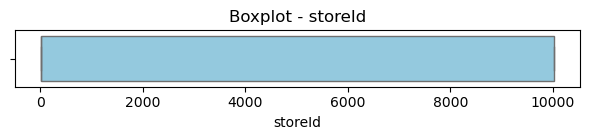

📌 pagerank
 - Median: 0.96
 - Max: 10.58 / Min: 0.18
 - Mean ± 3*Std: [-0.03, 1.95]
   → 🚨 이상값 의심됨 (3*표준편차 범위 초과)
 - Z-score > 3: 330건
   → 🚨 이상값 의심됨 (Z-score 기준)
 - IQR 범위: [0.69, 1.12]
 - IQR 기준 이상값: 5654건
   → 🚨 이상값 의심됨 (IQR 기준)



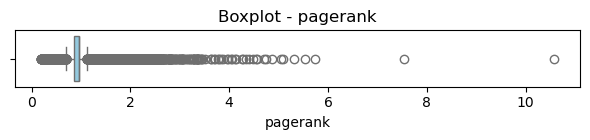

📌 degree
 - Median: 0.80
 - Max: 38.00 / Min: 0.16
 - Mean ± 3*Std: [-2.87, 5.07]
   → 🚨 이상값 의심됨 (3*표준편차 범위 초과)
 - Z-score > 3: 405건
   → 🚨 이상값 의심됨 (Z-score 기준)
 - IQR 범위: [-0.92, 2.60]
 - IQR 기준 이상값: 1754건
   → 🚨 이상값 의심됨 (IQR 기준)



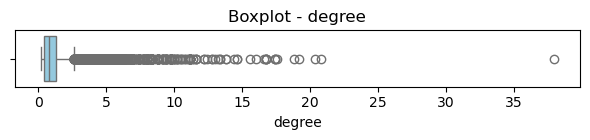

📌 betweenness
 - Median: 0.00
 - Max: 1386508.47 / Min: 0.00
 - Mean ± 3*Std: [-58888.27, 61412.30]
   → 🚨 이상값 의심됨 (3*표준편차 범위 초과)
 - Z-score > 3: 111건
   → 🚨 이상값 의심됨 (Z-score 기준)
 - IQR 범위: [0.00, 0.00]
 - IQR 기준 이상값: 1891건
   → 🚨 이상값 의심됨 (IQR 기준)



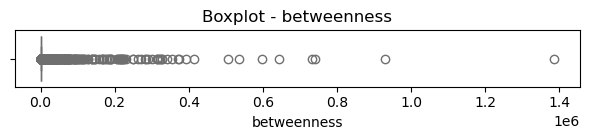

📌 closeness
 - Median: 1.00
 - Max: 1.00 / Min: 0.05
 - Mean ± 3*Std: [-0.05, 1.70]
   → ✅ 정상 범위 내
 - Z-score > 3: 0건
   → ✅ Z-score 이상 없음
 - IQR 범위: [0.17, 1.50]
 - IQR 기준 이상값: 1800건
   → 🚨 이상값 의심됨 (IQR 기준)



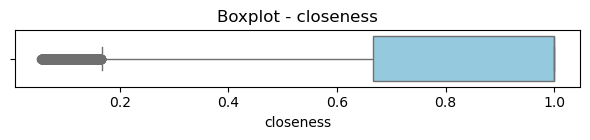

📌 eigen
 - Median: 0.01
 - Max: 0.11 / Min: 0.00
 - Mean ± 3*Std: [-0.01, 0.03]
   → 🚨 이상값 의심됨 (3*표준편차 범위 초과)
 - Z-score > 3: 371건
   → 🚨 이상값 의심됨 (Z-score 기준)
 - IQR 범위: [0.01, 0.01]
 - IQR 기준 이상값: 5683건
   → 🚨 이상값 의심됨 (IQR 기준)



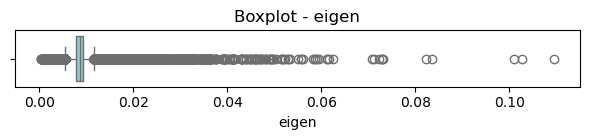

📌 community
 - Median: 5066.00
 - Max: 11575.00 / Min: 1.00
 - Mean ± 3*Std: [-4519.03, 14700.23]
   → ✅ 정상 범위 내
 - Z-score > 3: 0건
   → ✅ Z-score 이상 없음
 - IQR 범위: [-6082.00, 16038.00]
 - IQR 기준 이상값: 0건
   → ✅ IQR 기준 이상 없음



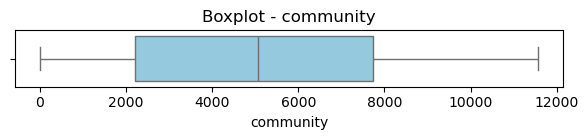


📦 [범주형 변수 희귀값 확인] (비율 < 1.0%)
 - customerId: 희귀값 22223개 (100.0%) → ⚠️ 희귀 범주 존재


In [103]:
detailed_outlier_report(df)